# Projet Fraud Detectioon for insurance company


## Install dependencies

In [1]:
# necessary imports 

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

import warnings
warnings.filterwarnings('ignore')

plt.style.use('ggplot')

In [2]:
df = pd.read_csv('insurance_claims.csv')

In [3]:
df.head()

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
0,328,48,521585,2014-10-17,OH,250/500,1000,1406.91,0,466132,...,YES,71610,6510,13020,52080,Saab,92x,2004,Y,NaN
1,228,42,342868,2006-06-27,IN,250/500,2000,1197.22,5000000,468176,...,?,5070,780,780,3510,Mercedes,E400,2007,Y,NaN
2,134,29,687698,2000-09-06,OH,100/300,2000,1413.14,5000000,430632,...,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,NaN
3,256,41,227811,1990-05-25,IL,250/500,2000,1415.74,6000000,608117,...,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,NaN
4,228,44,367455,2014-06-06,IL,500/1000,1000,1583.91,6000000,610706,...,NO,6500,1300,650,4550,Accura,RSX,2009,N,NaN


In [4]:
# we can see some missing values denoted by '?' so lets replace missing values with np.nan

df.replace('?', np.nan, inplace = True)

In [5]:
df.describe()

,months_as_customer,age,policy_number,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,capital-gains,capital-loss,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_year,_c39
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1.000000e+03,1000.000000,1000.000000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.000000,1000.000000,0.0
mean,203.954000,38.948000,546238.648000,1136.000000,1256.406150,1.101000e+06,501214.488000,25126.100000,-26793.700000,11.644000,1.83900,0.992000,1.487000,52761.94000,7433.420000,7399.570000,37928.950000,2005.103000,NaN
std,115.113174,9.140287,257063.005276,611.864673,244.167395,2.297407e+06,71701.610941,27872.187708,28104.096686,6.951373,1.01888,0.820127,1.111335,26401.53319,4880.951853,4824.726179,18886.252893,6.015861,NaN
min,0.000000,19.000000,100804.000000,500.000000,433.330000,-1.000000e+06,430104.000000,0.000000,-111100.000000,0.000000,1.00000,0.000000,0.000000,100.00000,0.000000,0.000000,70.000000,1995.000000,NaN
25%,115.750000,32.000000,335980.250000,500.000000,1089.607500,0.000000e+00,448404.500000,0.000000,-51500.000000,6.000000,1.00000,0.000000,1.000000,41812.50000,4295.000000,4445.000000,30292.500000,2000.000000,NaN
50%,199.500000,38.000000,533135.000000,1000.000000,1257.200000,0.000000e+00,466445.500000,0.000000,-23250.000000,12.000000,1.00000,1.000000,1.000000,58055.00000,6775.000000,6750.000000,42100.000000,2005.000000,NaN
75%,276.250000,44.000000,759099.750000,2000.000000,1415.695000,0.000000e+00,603251.000000,51025.000000,0.000000,17.000000,3.00000,2.000000,2.000000,70592.50000,11305.000000,10885.000000,50822.500000,2010.000000,NaN
max,479.000000,64.000000,999435.000000,2000.000000,2047.590000,1.000000e+07,620962.000000,100500.000000,0.000000,23.000000,4.00000,2.000000,3.000000,114920.00000,21450.000000,23670.000000,79560.000000,2015.000000,NaN


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 40 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   months_as_customer           1000 non-null   int64  
 1   age                          1000 non-null   int64  
 2   policy_number                1000 non-null   int64  
 3   policy_bind_date             1000 non-null   object 
 4   policy_state                 1000 non-null   object 
 5   policy_csl                   1000 non-null   object 
 6   policy_deductable            1000 non-null   int64  
 7   policy_annual_premium        1000 non-null   float64
 8   umbrella_limit               1000 non-null   int64  
 9   insured_zip                  1000 non-null   int64  
 10  insured_sex                  1000 non-null   object 
 11  insured_education_level      1000 non-null   object 
 12  insured_occupation           1000 non-null   object 
 13  insured_hobbies    

## Pretraitement des données

In [7]:
# missing values
df.isna().sum()

months_as_customer                0
age                               0
policy_number                     0
policy_bind_date                  0
policy_state                      0
policy_csl                        0
policy_deductable                 0
policy_annual_premium             0
umbrella_limit                    0
insured_zip                       0
insured_sex                       0
insured_education_level           0
insured_occupation                0
insured_hobbies                   0
insured_relationship              0
capital-gains                     0
capital-loss                      0
incident_date                     0
incident_type                     0
collision_type                  178
incident_severity                 0
authorities_contacted            91
incident_state                    0
incident_city                     0
incident_location                 0
incident_hour_of_the_day          0
number_of_vehicles_involved       0
property_damage             

### Handling missing values

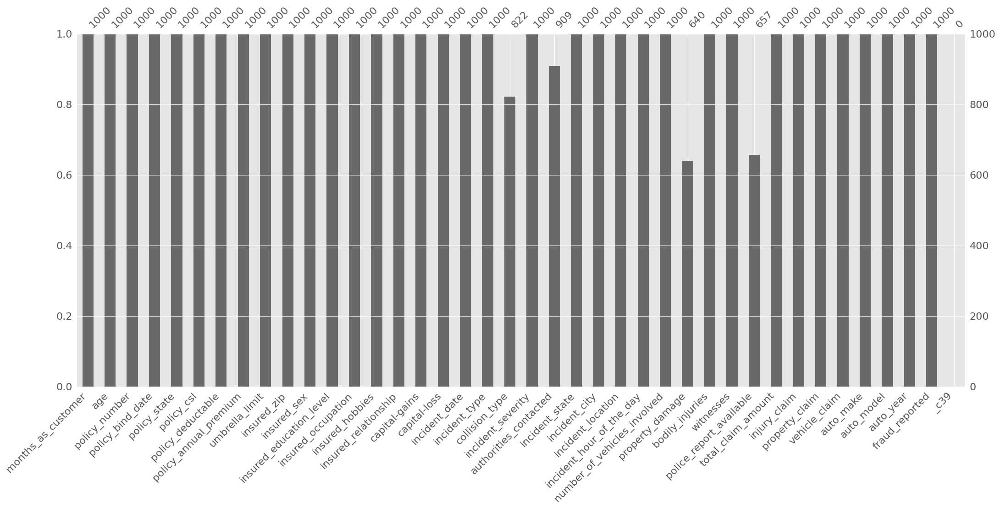

In [8]:
import missingno as msno



msno.bar(df)
plt.show()

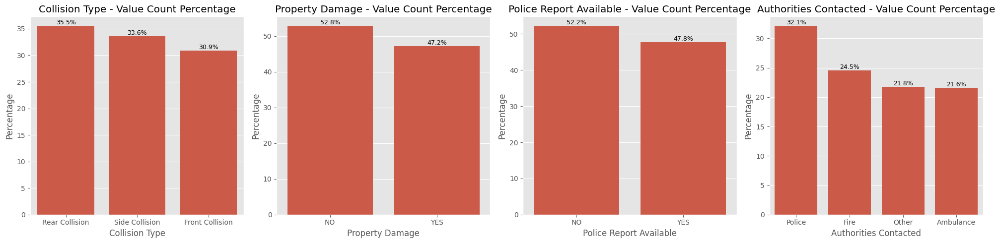

In [9]:
# Create a list of the categorical columns you want to visualize
Columns_with_missing_value = ['collision_type', 'property_damage', 'police_report_available', 'authorities_contacted']

# Create a figure with 4 subplots in one row
fig, axes = plt.subplots(1, 4, figsize=(20, 5), sharey=False)

for i, col in enumerate(Columns_with_missing_value):
    # Compute the percentage for each category
    freq = df[col].value_counts(normalize=True) * 100
    
    # Convert to a DataFrame for easier plotting
    freq_df = freq.reset_index()
    freq_df.columns = [col, 'percentage']
    
    # Plot on the i-th Axes
    sns.barplot(data=freq_df, x=col, y='percentage', ax=axes[i])
    
    # Title and labels
    axes[i].set_title(f"{col.replace('_',' ').title()} - Value Count Percentage")
    axes[i].set_ylabel('Percentage')
    axes[i].set_xlabel(col.replace('_',' ').title())
    
    # Display percentage labels above each bar
    for p in axes[i].patches:
        height = p.get_height()
        axes[i].annotate(f"{height:.1f}%", 
                         (p.get_x() + p.get_width() / 2, height), 
                         ha='center', va='bottom', fontsize=9)

plt.tight_layout()
plt.show()

In [10]:
df['collision_type'] = df['collision_type'].apply(
    lambda x: np.random.choice(df['collision_type'].dropna().unique(), 
                               p=df['collision_type'].value_counts(normalize=True).values) 
    if pd.isna(x) else x
)

In [11]:
df['property_damage'] = df['property_damage'].apply(
    lambda x: np.random.choice(df['property_damage'].dropna().unique(), 
                               p=df['property_damage'].value_counts(normalize=True).values) 
    if pd.isna(x) else x
)

In [12]:
df['police_report_available'] = df['police_report_available'].apply(
    lambda x: np.random.choice(df['police_report_available'].dropna().unique(), 
                               p=df['police_report_available'].value_counts(normalize=True).values) 
    if pd.isna(x) else x
)

In [13]:
df['authorities_contacted'] = df['authorities_contacted'].apply(
    lambda x: np.random.choice(df['authorities_contacted'].dropna().unique(), 
                               p=df['authorities_contacted'].value_counts(normalize=True).values) 
    if pd.isna(x) else x
)

In [14]:
df.isna().sum()

months_as_customer                0
age                               0
policy_number                     0
policy_bind_date                  0
policy_state                      0
policy_csl                        0
policy_deductable                 0
policy_annual_premium             0
umbrella_limit                    0
insured_zip                       0
insured_sex                       0
insured_education_level           0
insured_occupation                0
insured_hobbies                   0
insured_relationship              0
capital-gains                     0
capital-loss                      0
incident_date                     0
incident_type                     0
collision_type                    0
incident_severity                 0
authorities_contacted             0
incident_state                    0
incident_city                     0
incident_location                 0
incident_hour_of_the_day          0
number_of_vehicles_involved       0
property_damage             

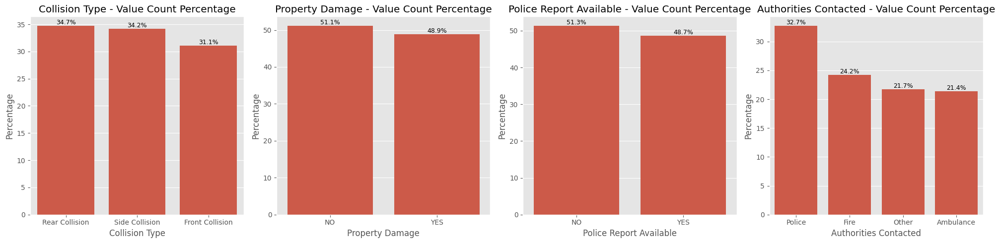

In [15]:
# Create a list of the categorical columns you want to visualize
Columns_with_missing_value = ['collision_type', 'property_damage', 'police_report_available', 'authorities_contacted']

# Create a figure with 4 subplots in one row
fig, axes = plt.subplots(1, 4, figsize=(20, 5), sharey=False)

for i, col in enumerate(Columns_with_missing_value):
    # Compute the percentage for each category
    freq = df[col].value_counts(normalize=True) * 100
    
    # Convert to a DataFrame for easier plotting
    freq_df = freq.reset_index()
    freq_df.columns = [col, 'percentage']
    
    # Plot on the i-th Axes
    sns.barplot(data=freq_df, x=col, y='percentage', ax=axes[i])
    
    # Title and labels
    axes[i].set_title(f"{col.replace('_',' ').title()} - Value Count Percentage")
    axes[i].set_ylabel('Percentage')
    axes[i].set_xlabel(col.replace('_',' ').title())
    
    # Display percentage labels above each bar
    for p in axes[i].patches:
        height = p.get_height()
        axes[i].annotate(f"{height:.1f}%", 
                         (p.get_x() + p.get_width() / 2, height), 
                         ha='center', va='bottom', fontsize=9)

plt.tight_layout()
plt.show()

replacing the missing values with a balanced distribution of the unique values for each column — because it maintains the statistical characteristics of the dataset while addressing the issue of missing data. This approach ensures that the proportions of the unique values in the dataset remain consistent, which is especially important for preserving the overall structure and representativeness of the data.

Reasons for Choosing This Method:

    Maintains Original Distribution:

- By replacing missing values proportionally to the existing distribution, the dataset retains its natural characteristics, avoiding artificial bias introduced by other methods (e.g., using the mode alone).
Balances Data Integrity and Completeness:

- Unlike removing rows with missing values (which leads to significant data loss), this method preserves all the rows and ensures the dataset remains complete.
Minimizes Bias:

- Replacing with the mode might overrepresent the most frequent category, skewing results. The balanced distribution approach avoids this by spreading replacements according to observed frequencies.
Logical for Analysis and Modeling:

- For machine learning and statistical modeling, this approach provides a cleaner, more realistic dataset, preventing issues like data imbalance that could arise from other methods.

- for column C39 it only has missing values so we will proceed by dropping it

In [16]:
#drop columns that only has missing values
df.drop(['_c39'], axis = 1, inplace = True)

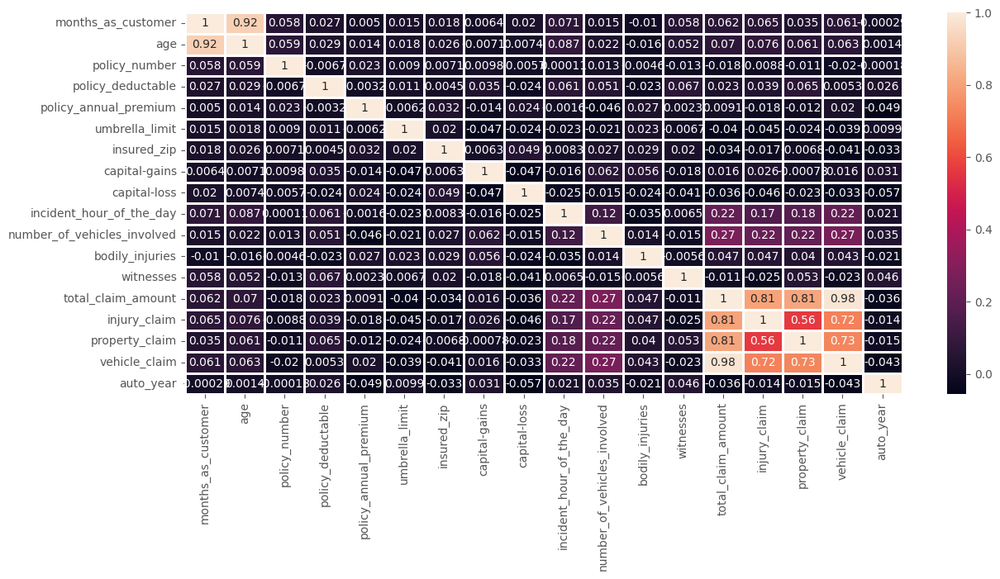

In [17]:
# heatmap

plt.figure(figsize = (14, 6))

# Select only numeric columns
numeric_df = df.select_dtypes(include=[np.number])

# Calculate the correlation matrix
corr = numeric_df.corr()

# Plot the heatmap
sns.heatmap(data = corr, annot = True, fmt = '.2g', linewidth = 1)

# Show the plot
plt.show()

In [18]:
df.nunique()

months_as_customer              391
age                              46
policy_number                  1000
policy_bind_date                951
policy_state                      3
policy_csl                        3
policy_deductable                 3
policy_annual_premium           991
umbrella_limit                   11
insured_zip                     995
insured_sex                       2
insured_education_level           7
insured_occupation               14
insured_hobbies                  20
insured_relationship              6
capital-gains                   338
capital-loss                    354
incident_date                    60
incident_type                     4
collision_type                    3
incident_severity                 4
authorities_contacted             4
incident_state                    7
incident_city                     7
incident_location              1000
incident_hour_of_the_day         24
number_of_vehicles_involved       4
property_damage             

In [19]:
# dropping columns which are not necessary for prediction

to_drop = ['policy_number','policy_bind_date','policy_state','insured_zip','incident_location','incident_date',
           'incident_state','incident_city','insured_hobbies','auto_make','auto_model','auto_year']

df.drop(to_drop, inplace = True, axis = 1)

In [20]:
df.head()

,months_as_customer,age,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,insured_occupation,insured_relationship,...,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,fraud_reported
0,328,48,250/500,1000,1406.91,0,MALE,MD,craft-repair,husband,...,1,YES,1,2,YES,71610,6510,13020,52080,Y
1,228,42,250/500,2000,1197.22,5000000,MALE,MD,machine-op-inspct,other-relative,...,1,NO,0,0,NO,5070,780,780,3510,Y
2,134,29,100/300,2000,1413.14,5000000,FEMALE,PhD,sales,own-child,...,3,NO,2,3,NO,34650,7700,3850,23100,N
3,256,41,250/500,2000,1415.74,6000000,FEMALE,PhD,armed-forces,unmarried,...,1,NO,1,2,NO,63400,6340,6340,50720,Y
4,228,44,500/1000,1000,1583.91,6000000,MALE,Associate,sales,unmarried,...,1,NO,0,1,NO,6500,1300,650,4550,N


### Elimination de certaines feature corrélé

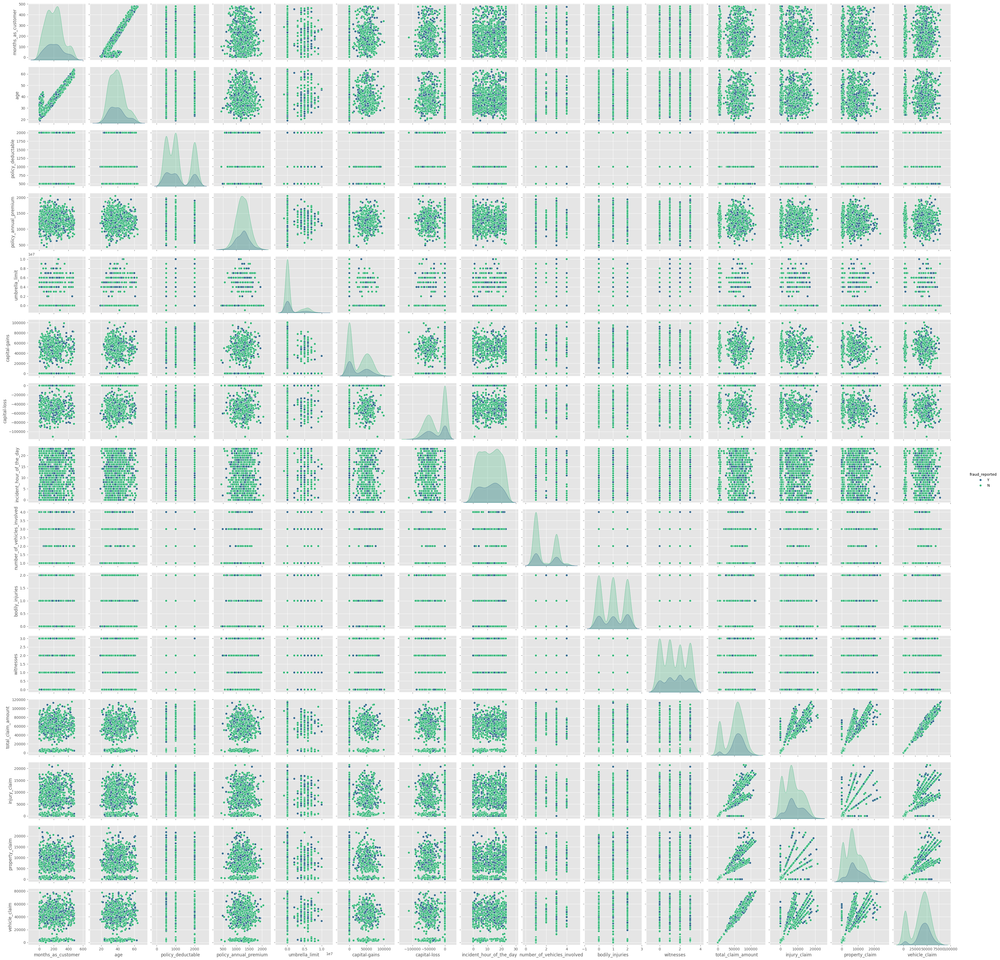

In [21]:
sns.pairplot(df, hue = 'fraud_reported', palette = 'viridis')
plt.show()

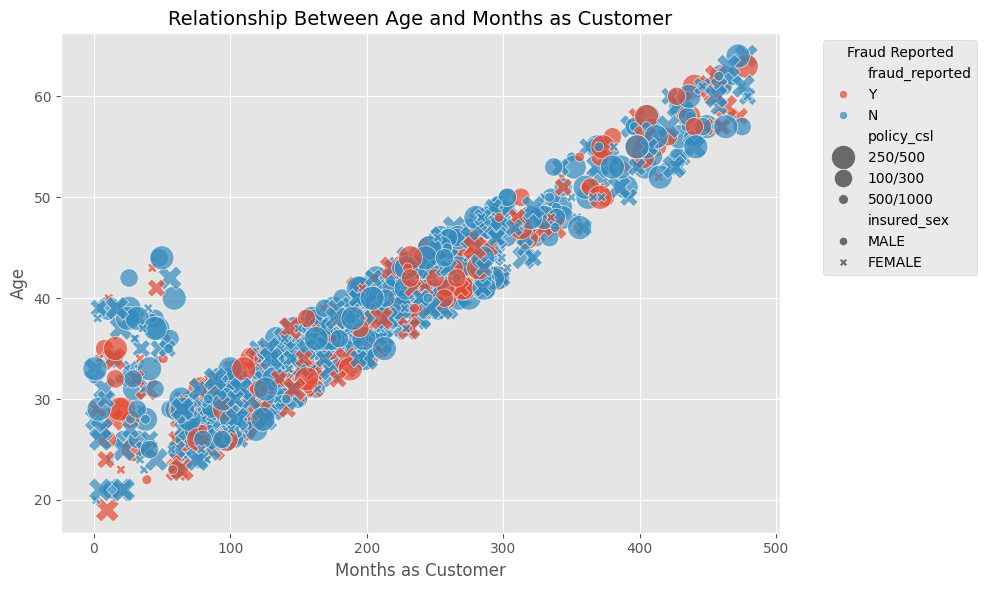

In [22]:
import seaborn as sns
import matplotlib.pyplot as plt

features = ['age', 'months_as_customer', 'policy_csl', 'insured_sex', 'fraud_reported']

# Create the scatterplot
plt.figure(figsize=(10, 6))

# Scatterplot using seaborn
sns.scatterplot(
    data=df,
    x='months_as_customer', 
    y='age', 
    hue='fraud_reported',  # Color by fraud reported (Y/N)
    size='policy_csl',     # Size based on policy coverage
    style='insured_sex',   # Marker style based on insured sex
    alpha=0.7, 
    sizes=(50, 300)        # Scale for marker sizes
)

# Add labels and title
plt.title('Relationship Between Age and Months as Customer', fontsize=14)
plt.xlabel('Months as Customer', fontsize=12)
plt.ylabel('Age', fontsize=12)
plt.legend(title='Fraud Reported', bbox_to_anchor=(1.05, 1), loc='upper left')

# Show plot
plt.tight_layout()
plt.show()


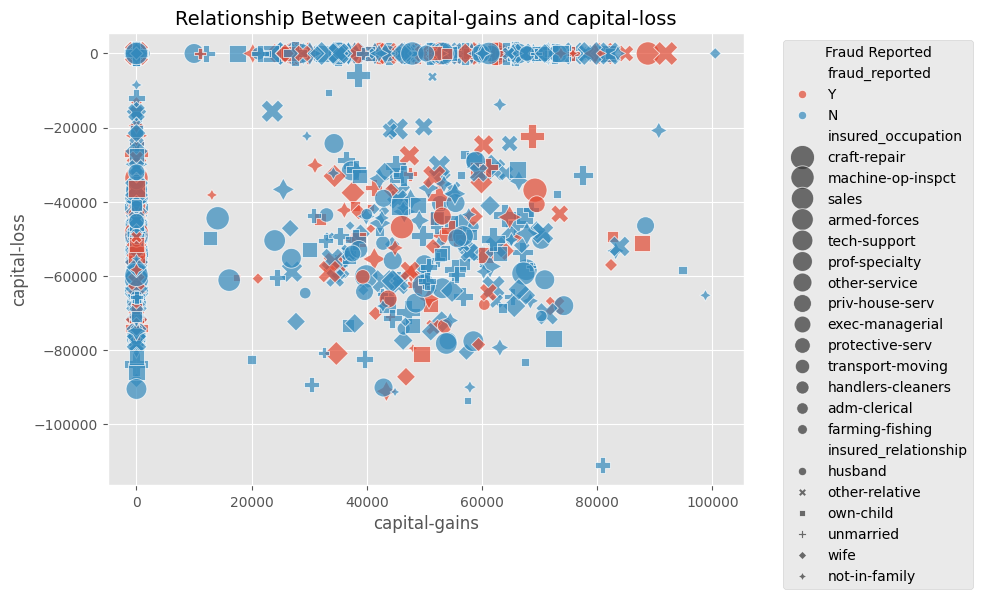

In [23]:
import seaborn as sns
import matplotlib.pyplot as plt


features = ['capital-gains ', 'capital-loss', 'insured_relationship', 'insured_occupation', 'fraud_reported']

# Create the scatterplot
plt.figure(figsize=(10, 6))

# Scatterplot using seaborn
sns.scatterplot(
    data=df,
    x='capital-gains', 
    y='capital-loss', 
    hue='fraud_reported',  # Color by fraud reported (Y/N)
    size='insured_occupation',     # Size based on policy coverage
    style='insured_relationship',   # Marker style based on insured sex
    alpha=0.7, 
    sizes=(50, 300)        # Scale for marker sizes
)

# Add labels and title
plt.title('Relationship Between capital-gains and capital-loss', fontsize=14)
plt.xlabel('capital-gains', fontsize=12)
plt.ylabel('capital-loss', fontsize=12)
plt.legend(title='Fraud Reported', bbox_to_anchor=(1.05, 1), loc='upper left')

# Show plot
plt.tight_layout()
plt.show()


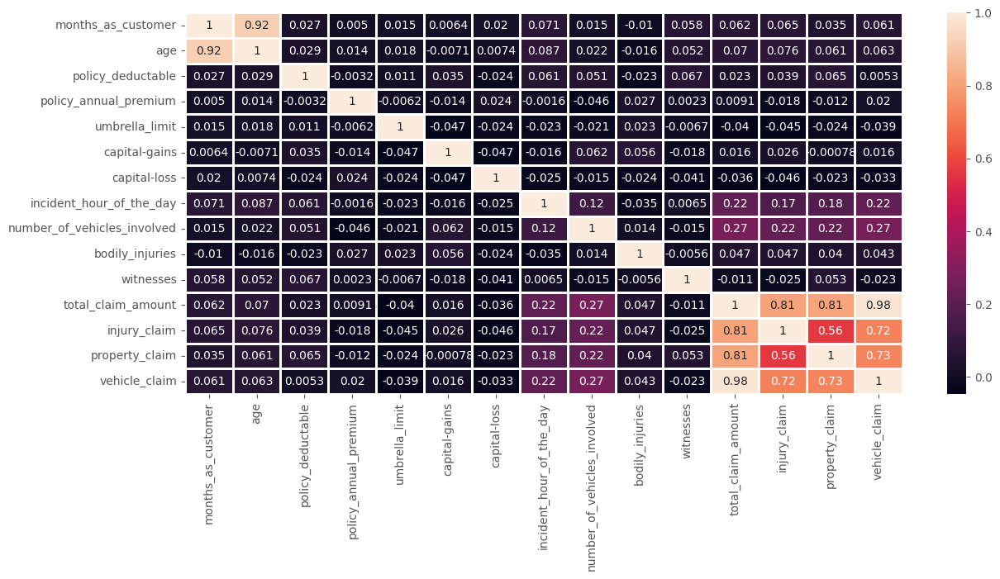

In [24]:
# # checking for multicollinearity

plt.figure(figsize = (14, 6))

# Select only numeric columns
numeric_df = df.select_dtypes(include=[np.number])

# Calculate the correlation matrix
corr = numeric_df.corr()
mask = np.triu(np.ones_like(corr, dtype = bool))

# Plot the heatmap
sns.heatmap(data = corr, annot = True, fmt = '.2g', linewidth = 1)

# Show the plot
plt.show()


The correlation of features (or variables) is an important concept in data analysis. It measures how strongly two variables are related to each other. This information can be particularly useful in predictive modeling to understand which variables have the most influence on your target variable or to identify features that are highly correlated with each other, which may indicate an issue of multicollinearity.

In our dataset, we observe correlations between several variables. For instance:
- `age` and `month_as_a_customer`
- `total_clam_amount`, `injury_claim`, `property_claim`, and `vehicle_claim` with `total_claim_amount`, which represents the sum of all claims.

To address this, we eliminate the variable `total_claim_amount` to reduce redundancy and potential multicollinearity issues.

In [25]:
df.drop(columns = ['age', 'total_claim_amount'], inplace = True, axis = 1)

In [26]:
df.head()

,months_as_customer,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,insured_occupation,insured_relationship,capital-gains,...,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,injury_claim,property_claim,vehicle_claim,fraud_reported
0,328,250/500,1000,1406.91,0,MALE,MD,craft-repair,husband,53300,...,5,1,YES,1,2,YES,6510,13020,52080,Y
1,228,250/500,2000,1197.22,5000000,MALE,MD,machine-op-inspct,other-relative,0,...,8,1,NO,0,0,NO,780,780,3510,Y
2,134,100/300,2000,1413.14,5000000,FEMALE,PhD,sales,own-child,35100,...,7,3,NO,2,3,NO,7700,3850,23100,N
3,256,250/500,2000,1415.74,6000000,FEMALE,PhD,armed-forces,unmarried,48900,...,5,1,NO,1,2,NO,6340,6340,50720,Y
4,228,500/1000,1000,1583.91,6000000,MALE,Associate,sales,unmarried,66000,...,20,1,NO,0,1,NO,1300,650,4550,N


In [27]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 25 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   months_as_customer           1000 non-null   int64  
 1   policy_csl                   1000 non-null   object 
 2   policy_deductable            1000 non-null   int64  
 3   policy_annual_premium        1000 non-null   float64
 4   umbrella_limit               1000 non-null   int64  
 5   insured_sex                  1000 non-null   object 
 6   insured_education_level      1000 non-null   object 
 7   insured_occupation           1000 non-null   object 
 8   insured_relationship         1000 non-null   object 
 9   capital-gains                1000 non-null   int64  
 10  capital-loss                 1000 non-null   int64  
 11  incident_type                1000 non-null   object 
 12  collision_type               1000 non-null   object 
 13  incident_severity  

In [28]:
# separating the feature and target columns

X = df.drop('fraud_reported', axis = 1)
y = df['fraud_reported']

### Encoding Categorical columns

### Label Encoding in Our Project

The method used in our project is **LabelEncoder**. Label encoding is used to convert categorical variables into a form that machine learning algorithms can understand and utilize. It is specifically used for **ordinal categorical variables**, i.e., categorical variables that have a defined order.

#### Example of Label Encoding:
For example, categorical variables with values like:
- `'low'`, `'medium'`, `'high'`, or 
- `'jan'`, `'feb'`, `'mar'`

The label encoder replaces these categorical values with numeric values while preserving the order of the categories. For instance:
- `'low'` is replaced with `0`
- `'medium'` is replaced with `1`
- `'high'` is replaced with `2`

#### Why Use Label Encoding Instead of One-Hot Encoding?
Using **one-hot encoding** requires creating new columns for every unique value in each column. Consequently:
- This significantly increases the number of columns and features.
- It leads to a sparse dataset with many zeros, which is inefficient for memory and storage.
- It increases the complexity of the predictive model due to the larger feature space, requiring more tuning and computational resources.

In contrast, label encoding keeps the dataset compact and maintains the ordinal relationship between values, making it a better choice for this scenario.

In [29]:
# extracting categorical columns
cat_df = X.select_dtypes(include = ['object'])

In [30]:
cat_df.head()

,policy_csl,insured_sex,insured_education_level,insured_occupation,insured_relationship,incident_type,collision_type,incident_severity,authorities_contacted,property_damage,police_report_available
0,250/500,MALE,MD,craft-repair,husband,Single Vehicle Collision,Side Collision,Major Damage,Police,YES,YES
1,250/500,MALE,MD,machine-op-inspct,other-relative,Vehicle Theft,Rear Collision,Minor Damage,Police,NO,NO
2,100/300,FEMALE,PhD,sales,own-child,Multi-vehicle Collision,Rear Collision,Minor Damage,Police,NO,NO
3,250/500,FEMALE,PhD,armed-forces,unmarried,Single Vehicle Collision,Front Collision,Major Damage,Police,NO,NO
4,500/1000,MALE,Associate,sales,unmarried,Vehicle Theft,Side Collision,Minor Damage,Police,NO,NO


In [31]:
# printing unique values of each column
for col in cat_df.columns:
    print(f"{col}: \n{cat_df[col].unique()}\n")

policy_csl: 
['250/500' '100/300' '500/1000']

insured_sex: 
['MALE' 'FEMALE']

insured_education_level: 
['MD' 'PhD' 'Associate' 'Masters' 'High School' 'College' 'JD']

insured_occupation: 
['craft-repair' 'machine-op-inspct' 'sales' 'armed-forces' 'tech-support'
 'prof-specialty' 'other-service' 'priv-house-serv' 'exec-managerial'
 'protective-serv' 'transport-moving' 'handlers-cleaners' 'adm-clerical'
 'farming-fishing']

insured_relationship: 
['husband' 'other-relative' 'own-child' 'unmarried' 'wife' 'not-in-family']

incident_type: 
['Single Vehicle Collision' 'Vehicle Theft' 'Multi-vehicle Collision'
 'Parked Car']

collision_type: 
['Side Collision' 'Rear Collision' 'Front Collision']

incident_severity: 
['Major Damage' 'Minor Damage' 'Total Loss' 'Trivial Damage']

authorities_contacted: 
['Police' 'Fire' 'Other' 'Ambulance']

property_damage: 
['YES' 'NO']

police_report_available: 
['YES' 'NO']



In [32]:
#label encoding for categorical columns

from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()

for col in cat_df.columns:
    cat_df[col] = le.fit_transform(cat_df[col])

cat_df.head()

,policy_csl,insured_sex,insured_education_level,insured_occupation,insured_relationship,incident_type,collision_type,incident_severity,authorities_contacted,property_damage,police_report_available
0,1,1,4,2,0,2,2,0,3,1,1
1,1,1,4,6,2,3,1,1,3,0,0
2,0,0,6,11,3,0,1,1,3,0,0
3,1,0,6,1,4,2,0,0,3,0,0
4,2,1,0,11,4,3,2,1,3,0,0


In [33]:
# extracting the numerical columns

num_df = X.select_dtypes(include = ['int64'])

In [34]:
num_df.head()

,months_as_customer,policy_deductable,umbrella_limit,capital-gains,capital-loss,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,injury_claim,property_claim,vehicle_claim
0,328,1000,0,53300,0,5,1,1,2,6510,13020,52080
1,228,2000,5000000,0,0,8,1,0,0,780,780,3510
2,134,2000,5000000,35100,0,7,3,2,3,7700,3850,23100
3,256,2000,6000000,48900,-62400,5,1,1,2,6340,6340,50720
4,228,1000,6000000,66000,-46000,20,1,0,1,1300,650,4550


In [35]:
# combining the Numerical and Categorical dataframes to get the final dataset

X = pd.concat([num_df, cat_df], axis = 1)

In [36]:
X.head()

,months_as_customer,policy_deductable,umbrella_limit,capital-gains,capital-loss,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,injury_claim,...,insured_sex,insured_education_level,insured_occupation,insured_relationship,incident_type,collision_type,incident_severity,authorities_contacted,property_damage,police_report_available
0,328,1000,0,53300,0,5,1,1,2,6510,...,1,4,2,0,2,2,0,3,1,1
1,228,2000,5000000,0,0,8,1,0,0,780,...,1,4,6,2,3,1,1,3,0,0
2,134,2000,5000000,35100,0,7,3,2,3,7700,...,0,6,11,3,0,1,1,3,0,0
3,256,2000,6000000,48900,-62400,5,1,1,2,6340,...,0,6,1,4,2,0,0,3,0,0
4,228,1000,6000000,66000,-46000,20,1,0,1,1300,...,1,0,11,4,3,2,1,3,0,0


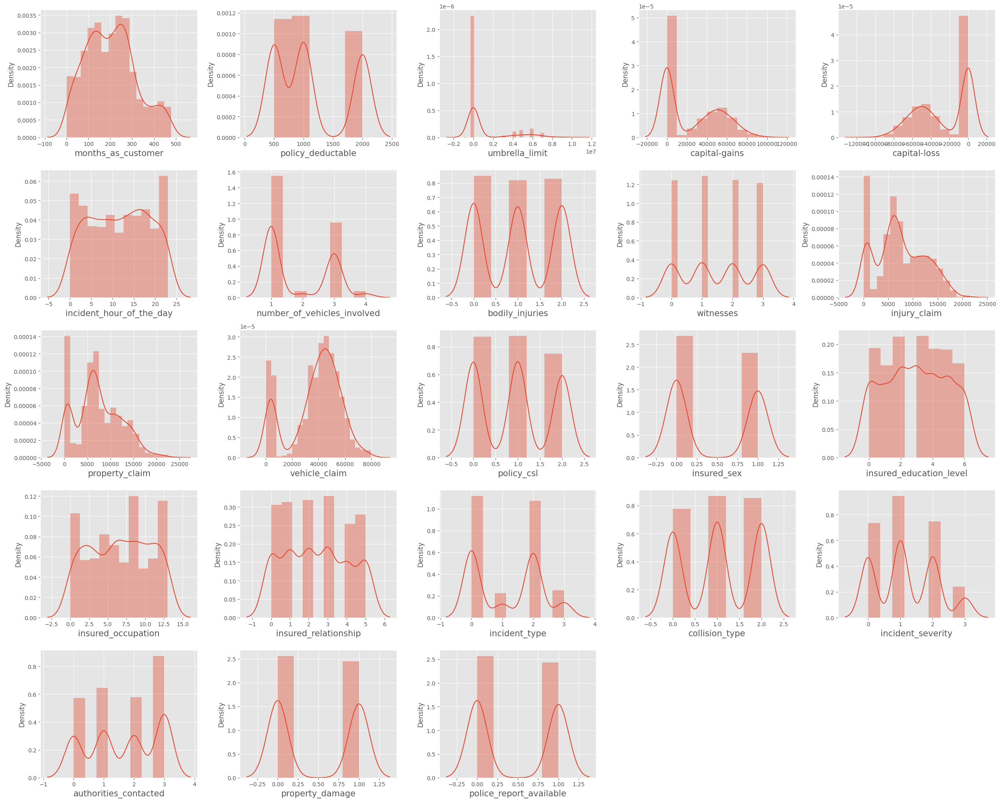

In [37]:
plt.figure(figsize = (25, 20))
plotnumber = 1

for col in X.columns:
    if plotnumber <= 24:
        ax = plt.subplot(5, 5, plotnumber)
        sns.distplot(X[col])
        plt.xlabel(col, fontsize = 15)
        
    plotnumber += 1
    
plt.tight_layout()
plt.show()

### Outliers detection

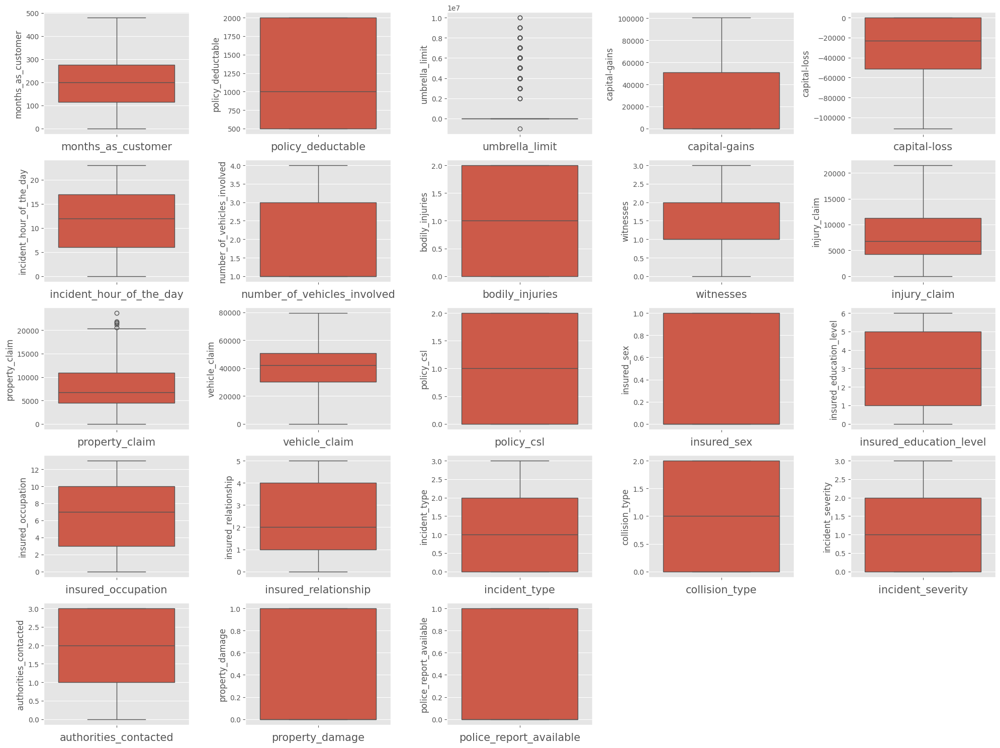

In [38]:
plt.figure(figsize = (20, 15))
plotnumber = 1

for col in X.columns:
    if plotnumber <= 24:
        ax = plt.subplot(5, 5, plotnumber)
        sns.boxplot(X[col])
        plt.xlabel(col, fontsize = 15)
    
    plotnumber += 1
plt.tight_layout()
plt.show()

**Outliers are present in some numerical columns we will scale numerical columns later**

## Split Data for train_set and test_set

In [39]:
# splitting data into training set and test set

from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25)

In [40]:
X_train.head()

,months_as_customer,policy_deductable,umbrella_limit,capital-gains,capital-loss,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,injury_claim,...,insured_sex,insured_education_level,insured_occupation,insured_relationship,incident_type,collision_type,incident_severity,authorities_contacted,property_damage,police_report_available
18,160,500,0,45500,-37800,19,1,1,0,6630,...,0,4,2,2,2,2,2,2,1,0
709,276,2000,0,0,-70400,17,1,1,2,5710,...,1,1,5,0,2,0,1,0,0,1
130,280,1000,0,57900,0,0,3,1,2,14120,...,1,3,6,5,0,0,1,2,1,0
281,186,1000,0,37600,-37600,3,1,2,1,860,...,0,0,2,5,3,1,3,3,0,1
735,293,1000,0,51500,0,13,3,1,1,11380,...,0,4,3,4,0,0,2,1,0,0


In [41]:
num_df = X_train[['months_as_customer', 'policy_deductable', 'umbrella_limit',
       'capital-gains', 'capital-loss', 'incident_hour_of_the_day',
       'number_of_vehicles_involved', 'bodily_injuries', 'witnesses', 'injury_claim', 'property_claim',
       'vehicle_claim']]

## Scaling the numeric values in the dataset

In [42]:
# Scaling the numeric values in the dataset

from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
scaled_data = scaler.fit_transform(num_df)

In [43]:
scaled_num_df = pd.DataFrame(data = scaled_data, columns = num_df.columns, index = X_train.index)
scaled_num_df.head()

,months_as_customer,policy_deductable,umbrella_limit,capital-gains,capital-loss,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,injury_claim,property_claim,vehicle_claim
18,-0.358175,-1.038327,-0.475102,0.732215,-0.353434,1.053713,-0.821890,0.030766,-1.366162,-0.180178,1.214666,0.787654
709,0.665383,1.462995,-0.475102,-0.904367,-1.505320,0.767689,-0.821890,0.030766,0.444123,-0.366616,-0.352612,0.094773
130,0.700678,-0.204553,-0.475102,1.178229,0.982190,-1.663516,1.147496,0.030766,0.444123,1.337674,1.393190,0.970019
281,-0.128757,-0.204553,-0.475102,0.448062,-0.346367,-1.234480,-0.821890,1.245209,-0.461019,-1.349470,-1.359406,-1.864592
735,0.815387,-0.204553,-0.475102,0.948029,0.982190,0.195640,1.147496,0.030766,-0.461019,0.782411,-0.356764,-0.214294


In [44]:
X_train.drop(columns = scaled_num_df.columns, inplace = True)

In [45]:
X_train = pd.concat([scaled_num_df, X_train], axis = 1)

In [46]:
X_train.head()

,months_as_customer,policy_deductable,umbrella_limit,capital-gains,capital-loss,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,injury_claim,...,insured_sex,insured_education_level,insured_occupation,insured_relationship,incident_type,collision_type,incident_severity,authorities_contacted,property_damage,police_report_available
18,-0.358175,-1.038327,-0.475102,0.732215,-0.353434,1.053713,-0.821890,0.030766,-1.366162,-0.180178,...,0,4,2,2,2,2,2,2,1,0
709,0.665383,1.462995,-0.475102,-0.904367,-1.505320,0.767689,-0.821890,0.030766,0.444123,-0.366616,...,1,1,5,0,2,0,1,0,0,1
130,0.700678,-0.204553,-0.475102,1.178229,0.982190,-1.663516,1.147496,0.030766,0.444123,1.337674,...,1,3,6,5,0,0,1,2,1,0
281,-0.128757,-0.204553,-0.475102,0.448062,-0.346367,-1.234480,-0.821890,1.245209,-0.461019,-1.349470,...,0,0,2,5,3,1,3,3,0,1
735,0.815387,-0.204553,-0.475102,0.948029,0.982190,0.195640,1.147496,0.030766,-0.461019,0.782411,...,0,4,3,4,0,0,2,1,0,0


## Train Models

### Support Vector Classifier

In [47]:
from sklearn.svm import SVC

svc = SVC()
svc.fit(X_train, y_train)

y_pred = svc.predict(X_test)

In [48]:
# accuracy_score, confusion_matrix and classification_report

from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

svc_train_acc = accuracy_score(y_train, svc.predict(X_train))
svc_test_acc = accuracy_score(y_test, y_pred)

print(f"Training accuracy of Support Vector Classifier is : {svc_train_acc}")
print(f"Test accuracy of Support Vector Classifier is : {svc_test_acc}")

print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

Training accuracy of Support Vector Classifier is : 0.7386666666666667
Test accuracy of Support Vector Classifier is : 0.796
[[199   0]
 [ 51   0]]
              precision    recall  f1-score   support

           N       0.80      1.00      0.89       199
           Y       0.00      0.00      0.00        51

    accuracy                           0.80       250
   macro avg       0.40      0.50      0.44       250
weighted avg       0.63      0.80      0.71       250



### KNN

In [49]:
from sklearn.neighbors import KNeighborsClassifier

knn = KNeighborsClassifier(n_neighbors = 30)
knn.fit(X_train, y_train)

y_pred = knn.predict(X_test)

In [50]:
# accuracy_score, confusion_matrix and classification_report

from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

knn_train_acc = accuracy_score(y_train, knn.predict(X_train))
knn_test_acc = accuracy_score(y_test, y_pred)

print(f"Training accuracy of KNN is : {knn_train_acc}")
print(f"Test accuracy of KNN is : {knn_test_acc}")

print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

Training accuracy of KNN is : 0.7413333333333333
Test accuracy of KNN is : 0.796
[[199   0]
 [ 51   0]]
              precision    recall  f1-score   support

           N       0.80      1.00      0.89       199
           Y       0.00      0.00      0.00        51

    accuracy                           0.80       250
   macro avg       0.40      0.50      0.44       250
weighted avg       0.63      0.80      0.71       250



### Decision Tree Classifier

In [51]:
from sklearn.tree import DecisionTreeClassifier

dtc = DecisionTreeClassifier()
dtc.fit(X_train, y_train)

y_pred = dtc.predict(X_test)

In [52]:
# accuracy_score, confusion_matrix and classification_report

from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

dtc_train_acc = accuracy_score(y_train, dtc.predict(X_train))
dtc_test_acc = accuracy_score(y_test, y_pred)

print(f"Training accuracy of Decision Tree is : {dtc_train_acc}")
print(f"Test accuracy of Decision Tree is : {dtc_test_acc}")

print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

Training accuracy of Decision Tree is : 1.0
Test accuracy of Decision Tree is : 0.752
[[170  29]
 [ 33  18]]
              precision    recall  f1-score   support

           N       0.84      0.85      0.85       199
           Y       0.38      0.35      0.37        51

    accuracy                           0.75       250
   macro avg       0.61      0.60      0.61       250
weighted avg       0.74      0.75      0.75       250



In [53]:
# hyper parameter tuning

from sklearn.model_selection import GridSearchCV

grid_params = {
    'criterion' : ['gini', 'entropy'],
    'max_depth' : [3, 5, 7, 10],
    'min_samples_split' : range(2, 10, 1),
    'min_samples_leaf' : range(2, 10, 1)
}

grid_search = GridSearchCV(dtc, grid_params, cv = 5, n_jobs = -1, verbose = 1)
grid_search.fit(X_train, y_train)

Fitting 5 folds for each of 512 candidates, totalling 2560 fits


GridSearchCV(cv=5, estimator=DecisionTreeClassifier(), n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [3, 5, 7, 10],
                         'min_samples_leaf': range(2, 10),
                         'min_samples_split': range(2, 10)},
             verbose=1)

In [54]:
# best parameters and best score

print(grid_search.best_params_)
print(grid_search.best_score_)

{'criterion': 'entropy', 'max_depth': 3, 'min_samples_leaf': 2, 'min_samples_split': 2}
0.808


In [55]:
# best estimator 

dtc = grid_search.best_estimator_

y_pred = dtc.predict(X_test)

In [56]:
# accuracy_score, confusion_matrix and classification_report

from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

dtc_train_acc = accuracy_score(y_train, dtc.predict(X_train))
dtc_test_acc = accuracy_score(y_test, y_pred)

print(f"Training accuracy of Decision Tree is : {dtc_train_acc}")
print(f"Test accuracy of Decision Tree is : {dtc_test_acc}")

print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

Training accuracy of Decision Tree is : 0.8133333333333334
Test accuracy of Decision Tree is : 0.784
[[174  25]
 [ 29  22]]
              precision    recall  f1-score   support

           N       0.86      0.87      0.87       199
           Y       0.47      0.43      0.45        51

    accuracy                           0.78       250
   macro avg       0.66      0.65      0.66       250
weighted avg       0.78      0.78      0.78       250



### Random Forest Classifier

In [57]:
from sklearn.ensemble import RandomForestClassifier

rand_clf = RandomForestClassifier(criterion= 'entropy', max_depth= 10, max_features= 'sqrt', min_samples_leaf= 1, min_samples_split= 3, n_estimators= 140)
rand_clf.fit(X_train, y_train)

y_pred = rand_clf.predict(X_test)

In [58]:
# accuracy_score, confusion_matrix and classification_report

from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

rand_clf_train_acc = accuracy_score(y_train, rand_clf.predict(X_train))
rand_clf_test_acc = accuracy_score(y_test, y_pred)

print(f"Training accuracy of Random Forest is : {rand_clf_train_acc}")
print(f"Test accuracy of Random Forest is : {rand_clf_test_acc}")

print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

Training accuracy of Random Forest is : 0.9773333333333334
Test accuracy of Random Forest is : 0.796
[[186  13]
 [ 38  13]]
              precision    recall  f1-score   support

           N       0.83      0.93      0.88       199
           Y       0.50      0.25      0.34        51

    accuracy                           0.80       250
   macro avg       0.67      0.59      0.61       250
weighted avg       0.76      0.80      0.77       250



### Ada Boost Classifier


In [59]:
from sklearn.ensemble import AdaBoostClassifier

ada = AdaBoostClassifier(estimator=dtc)

parameters = {
    'n_estimators' : [50, 70, 90, 120, 180, 200],
    'learning_rate' : [0.001, 0.01, 0.1, 1, 10],
    'algorithm' : ['SAMME', 'SAMME.R']
}

grid_search = GridSearchCV(ada, parameters, n_jobs = -1, cv = 5, verbose = 1)
grid_search.fit(X_train, y_train)

Fitting 5 folds for each of 60 candidates, totalling 300 fits


/home/blouz/anaconda3/envs/AI/lib/python3.12/site-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
/home/blouz/anaconda3/envs/AI/lib/python3.12/site-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
/home/blouz/anaconda3/envs/AI/lib/python3.12/site-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
/home/blouz/anaconda3/envs/AI/lib/python3.12/site-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME alg

GridSearchCV(cv=5,
             estimator=AdaBoostClassifier(estimator=DecisionTreeClassifier(criterion='entropy',
                                                                           max_depth=3,
                                                                           min_samples_leaf=2)),
             n_jobs=-1,
             param_grid={'algorithm': ['SAMME', 'SAMME.R'],
                         'learning_rate': [0.001, 0.01, 0.1, 1, 10],
                         'n_estimators': [50, 70, 90, 120, 180, 200]},
             verbose=1)

In [60]:
# best parameter and best score

print(grid_search.best_params_)
print(grid_search.best_score_)

{'algorithm': 'SAMME', 'learning_rate': 0.001, 'n_estimators': 50}
0.8093333333333333


In [61]:
# best estimator 

ada = grid_search.best_estimator_

y_pred = ada.predict(X_test)

In [62]:
# accuracy_score, confusion_matrix and classification_report

ada_train_acc = accuracy_score(y_train, ada.predict(X_train))
ada_test_acc = accuracy_score(y_test, y_pred)

print(f"Training accuracy of Ada Boost is : {ada_train_acc}")
print(f"Test accuracy of Ada Boost is : {ada_test_acc}")

print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

Training accuracy of Ada Boost is : 0.8133333333333334
Test accuracy of Ada Boost is : 0.784
[[174  25]
 [ 29  22]]
              precision    recall  f1-score   support

           N       0.86      0.87      0.87       199
           Y       0.47      0.43      0.45        51

    accuracy                           0.78       250
   macro avg       0.66      0.65      0.66       250
weighted avg       0.78      0.78      0.78       250



### Gradient Boosting Classifier

In [63]:
from sklearn.ensemble import GradientBoostingClassifier

gb = GradientBoostingClassifier()
gb.fit(X_train, y_train)

# accuracy score, confusion matrix and classification report of gradient boosting classifier

gb_acc = accuracy_score(y_test, gb.predict(X_test))

print(f"Training Accuracy of Gradient Boosting Classifier is {accuracy_score(y_train, gb.predict(X_train))}")
print(f"Test Accuracy of Gradient Boosting Classifier is {gb_acc} \n")

print(f"Confusion Matrix :- \n{confusion_matrix(y_test, gb.predict(X_test))}\n")
print(f"Classification Report :- \n {classification_report(y_test, gb.predict(X_test))}")

Training Accuracy of Gradient Boosting Classifier is 0.9226666666666666
Test Accuracy of Gradient Boosting Classifier is 0.652 

Confusion Matrix :- 
[[156  43]
 [ 44   7]]

Classification Report :- 
               precision    recall  f1-score   support

           N       0.78      0.78      0.78       199
           Y       0.14      0.14      0.14        51

    accuracy                           0.65       250
   macro avg       0.46      0.46      0.46       250
weighted avg       0.65      0.65      0.65       250



### Stochastic Gradient Boosting (SGB)

In [64]:
sgb = GradientBoostingClassifier(subsample = 0.90, max_features = 0.70)
sgb.fit(X_train, y_train)

# accuracy score, confusion matrix and classification report of stochastic gradient boosting classifier

sgb_acc = accuracy_score(y_test, sgb.predict(X_test))

print(f"Training Accuracy of Stochastic Gradient Boosting is {accuracy_score(y_train, sgb.predict(X_train))}")
print(f"Test Accuracy of Stochastic Gradient Boosting is {sgb_acc} \n")

print(f"Confusion Matrix :- \n{confusion_matrix(y_test, sgb.predict(X_test))}\n")
print(f"Classification Report :- \n {classification_report(y_test, sgb.predict(X_test))}")

Training Accuracy of Stochastic Gradient Boosting is 0.9253333333333333
Test Accuracy of Stochastic Gradient Boosting is 0.564 

Confusion Matrix :- 
[[122  77]
 [ 32  19]]

Classification Report :- 
               precision    recall  f1-score   support

           N       0.79      0.61      0.69       199
           Y       0.20      0.37      0.26        51

    accuracy                           0.56       250
   macro avg       0.50      0.49      0.47       250
weighted avg       0.67      0.56      0.60       250



### LGBM Classifier

In [65]:
from lightgbm import LGBMClassifier

lgbm = LGBMClassifier(learning_rate = 1)
lgbm.fit(X_train, y_train)

# accuracy score, confusion matrix and classification report of lgbm classifier

lgbm_acc = accuracy_score(y_test, lgbm.predict(X_test))

print(f"Training Accuracy of LGBM Classifier is {accuracy_score(y_train, lgbm.predict(X_train))}")
print(f"Test Accuracy of LGBM Classifier is {lgbm_acc} \n")

print(f"{confusion_matrix(y_test, lgbm.predict(X_test))}\n")
print(classification_report(y_test, lgbm.predict(X_test)))

[LightGBM] [Info] Number of positive: 196, number of negative: 554
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.018675 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1359
[LightGBM] [Info] Number of data points in the train set: 750, number of used features: 23
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.261333 -> initscore=-1.039050
[LightGBM] [Info] Start training from score -1.039050
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

### Voting Classifier

In [66]:
from sklearn.ensemble import VotingClassifier

classifiers = [('Support Vector Classifier', svc), ('KNN', knn),  ('Decision Tree', dtc), ('Random Forest', rand_clf),
               ('Ada Boost', ada), ('Gradient Boosting Classifier', gb), ('SGB', sgb),
              ('LGBM', lgbm)]

vc = VotingClassifier(estimators = classifiers)
vc.fit(X_train, y_train)

y_pred = vc.predict(X_test)

[LightGBM] [Info] Number of positive: 196, number of negative: 554
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000199 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1359
[LightGBM] [Info] Number of data points in the train set: 750, number of used features: 23
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.261333 -> initscore=-1.039050
[LightGBM] [Info] Start training from score -1.039050
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

In [67]:
# accuracy_score, confusion_matrix and classification_report

vc_train_acc = accuracy_score(y_train, vc.predict(X_train))
vc_test_acc = accuracy_score(y_test, y_pred)

print(f"Training accuracy of Voting Classifier is : {vc_train_acc}")
print(f"Test accuracy of Voting Classifier is : {vc_test_acc}")

print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

Training accuracy of Voting Classifier is : 0.916
Test accuracy of Voting Classifier is : 0.768
[[189  10]
 [ 48   3]]
              precision    recall  f1-score   support

           N       0.80      0.95      0.87       199
           Y       0.23      0.06      0.09        51

    accuracy                           0.77       250
   macro avg       0.51      0.50      0.48       250
weighted avg       0.68      0.77      0.71       250



### Model Comparaison

In [68]:
models = pd.DataFrame({
    'Model' : ['SVC', 'KNN', 'Decision Tree', 'Random Forest','Ada Boost', 'Gradient Boost', 'SGB','LGBM', 'Voting Classifier'],
    'Score' : [svc_test_acc, knn_test_acc, dtc_test_acc, rand_clf_test_acc, ada_test_acc, gb_acc, sgb_acc, lgbm_acc, vc_test_acc]
})


models.sort_values(by = 'Score', ascending = False)

,Model,Score
0,SVC,0.796
1,KNN,0.796
3,Random Forest,0.796
7,LGBM,0.788
2,Decision Tree,0.784
4,Ada Boost,0.784
8,Voting Classifier,0.768
5,Gradient Boost,0.652
6,SGB,0.564


In [69]:
px.bar(data_frame = models, x = 'Score', y = 'Model', color = 'Score', template = 'plotly_dark', 
       title = 'Models Comparison')

ValueError: Mime type rendering requires nbformat>=4.2.0 but it is not installed

Figure({
    'data': [{'alignmentgroup': 'True',
              'hovertemplate': 'Score=%{marker.color}<br>Model=%{y}<extra></extra>',
              'legendgroup': '',
              'marker': {'color': array([0.796, 0.796, 0.784, 0.796, 0.784, 0.652, 0.564, 0.788, 0.768]),
                         'coloraxis': 'coloraxis',
                         'pattern': {'shape': ''}},
              'name': '',
              'offsetgroup': '',
              'orientation': 'h',
              'showlegend': False,
              'textposition': 'auto',
              'type': 'bar',
              'x': array([0.796, 0.796, 0.784, 0.796, 0.784, 0.652, 0.564, 0.788, 0.768]),
              'xaxis': 'x',
              'y': array(['SVC', 'KNN', 'Decision Tree', 'Random Forest', 'Ada Boost',
                          'Gradient Boost', 'SGB', 'LGBM', 'Voting Classifier'], dtype=object),
              'yaxis': 'y'}],
    'layout': {'barmode': 'relative',
               'coloraxis': {'colorbar': {'title': {'text': 'Score'}},
                             'colorscale': [[0.0, '#0d0887'], [0.1111111111111111,
                                            '#46039f'], [0.2222222222222222,
                                            '#7201a8'], [0.3333333333333333,
                                            '#9c179e'], [0.4444444444444444,
                                            '#bd3786'], [0.5555555555555556,
                                            '#d8576b'], [0.6666666666666666,
                                            '#ed7953'], [0.7777777777777778,
                                            '#fb9f3a'], [0.8888888888888888,
                                            '#fdca26'], [1.0, '#f0f921']]},
               'legend': {'tracegroupgap': 0},
               'template': '...',
               'title': {'text': 'Models Comparison'},
               'xaxis': {'anchor': 'y', 'domain': [0.0, 1.0], 'title': {'text': 'Score'}},
               'yaxis': {'anchor': 'x', 'domain': [0.0, 1.0], 'title': {'text': 'Model'}}}
})

### Observations on Model Recall and Data Balancing

All models show low recall scores, suggesting that they may not be very effective at identifying fraud cases. 

This is due to the problem of an imbalanced dataset in the target variable. To address this, we used the **SMOTE technique** (Synthetic Minority Oversampling Technique), which is designed to oversample the minority class in order to balance the dataset.


In [70]:
from imblearn.over_sampling import SMOTE
from collections import Counter
import pandas as pd

# Check class distribution before SMOTE
print("Class distribution before SMOTE:")
print(Counter(y_train))

# Apply SMOTE to balance the dataset
smote = SMOTE(random_state=42)
X_train_balanced, y_train_balanced = smote.fit_resample(X_train, y_train)

# Check class distribution after SMOTE
print("\nClass distribution after SMOTE:")
print(Counter(y_train_balanced))


Class distribution before SMOTE:
Counter({'N': 554, 'Y': 196})

Class distribution after SMOTE:
Counter({'N': 554, 'Y': 554})


In [71]:
# Retrain Support Vector Classifier
svc.fit(X_train_balanced, y_train_balanced)
svc_y_pred = svc.predict(X_test)

# Retrain KNN
knn.fit(X_train_balanced, y_train_balanced)
knn_y_pred = knn.predict(X_test)

# Retrain Decision Tree Classifier
dtc.fit(X_train_balanced, y_train_balanced)
dtc_y_pred = dtc.predict(X_test)

# Retrain Random Forest Classifier
rand_clf.fit(X_train_balanced, y_train_balanced)
rand_clf_y_pred = rand_clf.predict(X_test)

# Retrain Ada Boost Classifier
ada.fit(X_train_balanced, y_train_balanced)
ada_y_pred = ada.predict(X_test)

# Retrain Gradient Boosting Classifier
gb.fit(X_train_balanced, y_train_balanced)
gb_y_pred = gb.predict(X_test)

# Retrain Stochastic Gradient Boosting (SGB)
sgb.fit(X_train_balanced, y_train_balanced)
sgb_y_pred = sgb.predict(X_test)

# Retrain LGBM Classifier
lgbm.fit(X_train_balanced, y_train_balanced)
lgbm_y_pred = lgbm.predict(X_test)

# Retrain Voting Classifier
vc.fit(X_train_balanced, y_train_balanced)
vc_y_pred = vc.predict(X_test)

# Evaluate all models
models_balanced = pd.DataFrame({
    'Model': ['SVC', 'KNN', 'Decision Tree', 'Random Forest', 'Ada Boost', 'Gradient Boost', 'SGB', 'LGBM', 'Voting Classifier'],
    'Score': [
        accuracy_score(y_test, svc_y_pred),
        accuracy_score(y_test, knn_y_pred),
        accuracy_score(y_test, dtc_y_pred),
        accuracy_score(y_test, rand_clf_y_pred),
        accuracy_score(y_test, ada_y_pred),
        accuracy_score(y_test, gb_y_pred),
        accuracy_score(y_test, sgb_y_pred),
        accuracy_score(y_test, lgbm_y_pred),
        accuracy_score(y_test, vc_y_pred)
    ]
})

models_balanced.sort_values(by='Score', ascending=False)

[LightGBM] [Info] Number of positive: 554, number of negative: 554
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000363 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2053
[LightGBM] [Info] Number of data points in the train set: 1108, number of used features: 23
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits wi

,Model,Score
2,Decision Tree,0.812
4,Ada Boost,0.812
0,SVC,0.796
8,Voting Classifier,0.768
3,Random Forest,0.764
7,LGBM,0.732
1,KNN,0.668
5,Gradient Boost,0.492
6,SGB,0.488


In [72]:
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

# Function to evaluate and print metrics for a model
def evaluate_model(model, X_test, y_test, model_name):
    y_pred = model.predict(X_test)
    print(f"Metrics for {model_name}:")
    print(f"Accuracy: {accuracy_score(y_test, y_pred)}")
    print("Confusion Matrix:")
    print(confusion_matrix(y_test, y_pred))
    print("Classification Report:")
    print(classification_report(y_test, y_pred))
    print("\n")

# Evaluate all models
evaluate_model(svc, X_test, y_test, "Support Vector Classifier")
evaluate_model(knn, X_test, y_test, "KNN")
evaluate_model(dtc, X_test, y_test, "Decision Tree")
evaluate_model(rand_clf, X_test, y_test, "Random Forest")
evaluate_model(ada, X_test, y_test, "Ada Boost")
evaluate_model(gb, X_test, y_test, "Gradient Boost")
evaluate_model(sgb, X_test, y_test, "Stochastic Gradient Boost")
evaluate_model(lgbm, X_test, y_test, "LGBM")
evaluate_model(vc, X_test, y_test, "Voting Classifier")

Metrics for Support Vector Classifier:
Accuracy: 0.796
Confusion Matrix:
[[199   0]
 [ 51   0]]
Classification Report:
              precision    recall  f1-score   support

           N       0.80      1.00      0.89       199
           Y       0.00      0.00      0.00        51

    accuracy                           0.80       250
   macro avg       0.40      0.50      0.44       250
weighted avg       0.63      0.80      0.71       250



Metrics for KNN:
Accuracy: 0.668
Confusion Matrix:
[[156  43]
 [ 40  11]]
Classification Report:
              precision    recall  f1-score   support

           N       0.80      0.78      0.79       199
           Y       0.20      0.22      0.21        51

    accuracy                           0.67       250
   macro avg       0.50      0.50      0.50       250
weighted avg       0.68      0.67      0.67       250



Metrics for Decision Tree:
Accuracy: 0.812
Confusion Matrix:
[[169  30]
 [ 17  34]]
Classification Report:
              preci

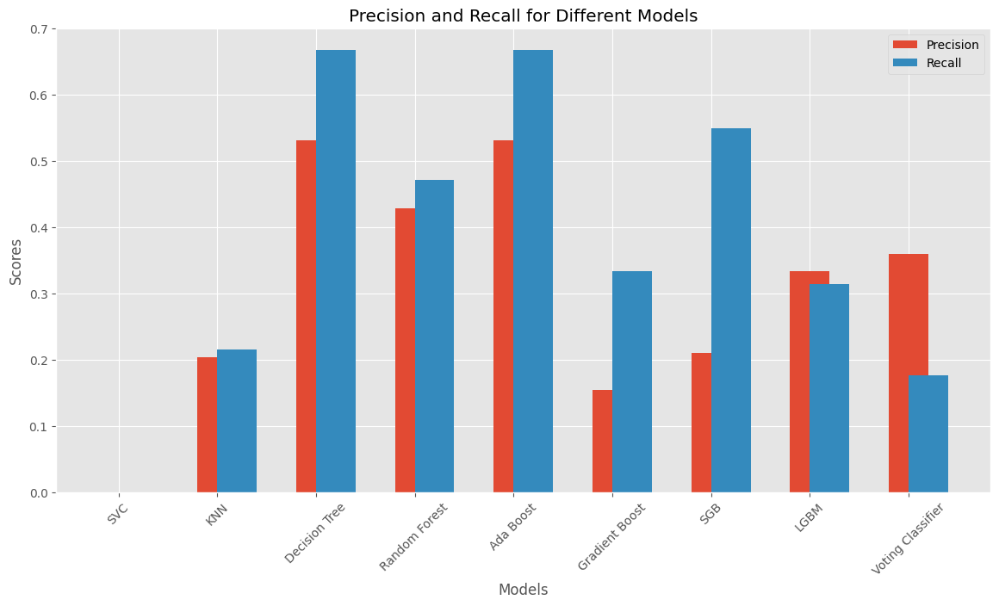

In [73]:
from sklearn.metrics import precision_score, recall_score

import matplotlib.pyplot as plt

# Function to evaluate precision and recall for a model
def evaluate_precision_recall(model, X_test, y_test):
    y_pred = model.predict(X_test)
    precision = precision_score(y_test, y_pred, pos_label='Y')
    recall = recall_score(y_test, y_pred, pos_label='Y')
    return precision, recall

# Evaluate all models
models = {
    'SVC': svc,
    'KNN': knn,
    'Decision Tree': dtc,
    'Random Forest': rand_clf,
    'Ada Boost': ada,
    'Gradient Boost': gb,
    'SGB': sgb,
    'LGBM': lgbm,
    'Voting Classifier': vc
}

precision_scores = []
recall_scores = []
model_names = []

for model_name, model in models.items():
    precision, recall = evaluate_precision_recall(model, X_test, y_test)
    precision_scores.append(precision)
    recall_scores.append(recall)
    model_names.append(model_name)

# Plotting
x = range(len(model_names))
plt.figure(figsize=(14, 7))
plt.bar(x, precision_scores, width=0.4, label='Precision', align='center')
plt.bar(x, recall_scores, width=0.4, label='Recall', align='edge')
plt.xlabel('Models')
plt.ylabel('Scores')
plt.title('Precision and Recall for Different Models')
plt.xticks(x, model_names, rotation=45)
plt.legend()
plt.show()